In [1]:
from PIL import Image
from pathlib import Path
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

In [2]:
# Función que recibe la ruta de una imagen y devuelve el nombre de la carpeta donde está (NOMBRE DE LA CLASE)
def get_class(x):
    return x.parent.name

In [3]:
# Agarra todas las imágenes que encuentra en TRAIN  y las organiza en una tabla con 4 columnas: Ruta, Clase, Resolución y la imagen en sí
data_dir = r'data/Split_smol/train/'
p = Path(data_dir).glob('**/*')
files = [(x, get_class(x), Image.open(x).size,Image.open(x)) for x in p if x.is_file()]
df_train = pd.DataFrame(files, columns=["path", "class", "resolution","data"])

In [4]:
# Agarra todas las imágenes que encuentra en VAL  y las organiza en una tabla con 4 columnas: Ruta, Clase, Resolución y la imagen en sí
data_dir = r'data/Split_smol/val/'
p = Path(data_dir).glob('**/*')
files = [(x, get_class(x), Image.open(x).size,Image.open(x)) for x in p if x.is_file()]
df_val = pd.DataFrame(files, columns=["path", "class", "resolution", "data"])

# Introducción

El dataset contiene imágenes de 9 condiciones dermatológicas distintas, divididas en conjuntos de entrenamiento y validación. Antes de entrenar cualquier modelo, es importante entender la estructura y características de los datos.

# 1. Distribucion de clases del dataset

La siguiente tabla muestra la cantidad de imágenes por clase en los conjuntos de entrenamiento y validación. 

In [5]:
# Tabla resumen de distribucion de clases en el datset

train_counts = df_train.groupby("class").size().reset_index(name='Train')
val_counts = df_val.groupby("class").size().reset_index(name='Val')

tabla = train_counts.merge(val_counts, on='class')
tabla['Total'] = tabla['Train'] + tabla['Val']
tabla = tabla.sort_values('Total', ascending=False).reset_index(drop=True)
tabla.columns = ['Clase', 'Train', 'Val', 'Total']

tabla.style\
    .set_caption("Distribución de imágenes por clase")\
    .set_properties(**{
        'background-color': 'white',
        'color': '#333333',
        'border': '1px solid #f4a7b9',
        'text-align': 'center',
        'font-family': 'Georgia',
        'padding': '8px'
    })\
    .set_table_styles([{
        'selector': 'th',
        'props': [
            ('background-color', 'white'),
            ('color', '#333333'),
            ('font-size', '13px'),
            ('text-align', 'center'),
            ('padding', '10px'),
            ('border-bottom', '2px solid #f4a7b9')
        ]
    }, {
        'selector': 'caption',
        'props': [
            ('font-size', '15px'),
            ('color', '#333333'),
            ('font-weight', 'bold'),
            ('padding', '10px')
        ]
    }])\
    .highlight_min(subset=['Train'], color='#fce4ec')

,Clase,Train,Val,Total
0,Atopic Dermatitis,81,21,102
1,Actinic keratosis,80,20,100
2,Benign keratosis,80,20,100
3,Dermatofibroma,80,20,100
4,Melanocytic nevus,80,20,100
5,Melanoma,80,20,100
6,Squamous cell carcinoma,80,20,100
7,Vascular lesion,80,20,100
8,Tinea Ringworm Candidiasis,55,19,74


Como se puede observar el mismo está bastante balanceado, con aproximadamente 80 imágenes por clase en train y 20 en val. Sin embargo la clase **Tinea Ringworm Candidiasis** (resaltada en rosa),  cuenta con menos imágenes en el Dataset de entrenamiento, y por ende en el total. 

A su vez, se puede visualizar la misma informacion de manera mas visual en el siguiente histrograma.

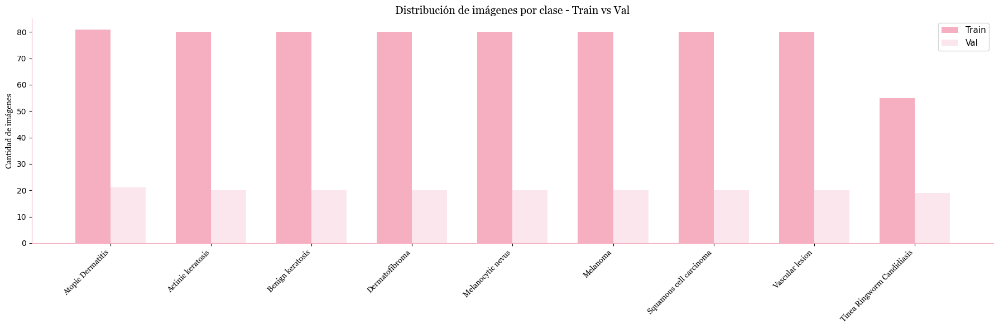

In [6]:
# Histograma mostrando cuántas imágenes hay de cada clase, comparando train y val.
train_cls = df_train.groupby("class").size().reset_index(name='count')
val_cls = df_val.groupby("class").size().reset_index(name='count')

merged_cls = train_cls.merge(val_cls, on='class', suffixes=('_train', '_val')).sort_values('count_train', ascending=False)

x = np.arange(len(merged_cls))
width = 0.35

fig, ax = plt.subplots(figsize=(18,6))
ax.bar(x - width/2, merged_cls['count_train'], width, label='Train', color='#f4a7b9', alpha=0.9)
ax.bar(x + width/2, merged_cls['count_val'], width, label='Val', color='#fce4ec', alpha=0.9)

ax.set_xticks(x)
ax.set_xticklabels(merged_cls['class'], rotation=45, ha='right', fontfamily='Georgia')
ax.set_ylabel('Cantidad de imágenes', fontfamily='Georgia')
ax.set_title('Distribución de imágenes por clase - Train vs Val', fontfamily='Georgia', fontsize=14)
ax.legend(fontsize=11)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')
plt.tight_layout()
plt.show()

# 2. Distribucion de resoluciones del dataset

La siguiente tabla muestra la cantidad de imágenes de cada resolucion (tamaño) en los conjuntos de entrenamiento y validación, para las 9 clases. 


In [7]:
# Tabla resumen de resoluciones más frecuentes
train_res = df_train.groupby("resolution").size().reset_index(name='Train')
val_res = df_val.groupby("resolution").size().reset_index(name='Val')

tabla_res = train_res.merge(val_res, on='resolution', suffixes=('', '')).sort_values('Train', ascending=False).head(10).reset_index(drop=True)
tabla_res['Total'] = tabla_res['Train'] + tabla_res['Val']
tabla_res.columns = ['Resolución', 'Train', 'Val', 'Total']

tabla_res.style\
    .set_caption("Top 10 resoluciones más frecuentes")\
    .set_properties(**{
        'background-color': 'white',
        'color': '#333333',
        'border': '1px solid #f4a7b9',
        'text-align': 'center',
        'font-family': 'Georgia',
        'padding': '8px'
    })\
    .set_table_styles([{
        'selector': 'th',
        'props': [
            ('background-color', 'white'),
            ('color', '#333333'),
            ('font-size', '13px'),
            ('text-align', 'center'),
            ('padding', '10px'),
            ('border-bottom', '2px solid #f4a7b9')
        ]
    }, {
        'selector': 'caption',
        'props': [
            ('font-size', '15px'),
            ('color', '#333333'),
            ('font-weight', 'bold'),
            ('padding', '10px')
        ]
    }])

,Resolución,Train,Val,Total
0,"(600, 450)",320,80,400
1,"(1024, 768)",108,27,135
2,"(294, 222)",81,21,102
3,"(1024, 764)",60,14,74
4,"(1022, 767)",16,5,21
5,"(767, 576)",10,2,12
6,"(919, 802)",5,1,6
7,"(1024, 681)",4,1,5
8,"(1024, 680)",3,1,4
9,"(1024, 679)",2,2,4


El dataset presenta una gran variedad de resoluciones, siendo la más común **(600, 450)** con 400 imágenes en total. Dado que las imágenes tienen distintos tamaños, es necesario redimensionarlas todas a una resolución fija antes de entrenar. 

A su vez, se puede visualizar la misma informacion de manera mas visual en el siguiente histrograma.

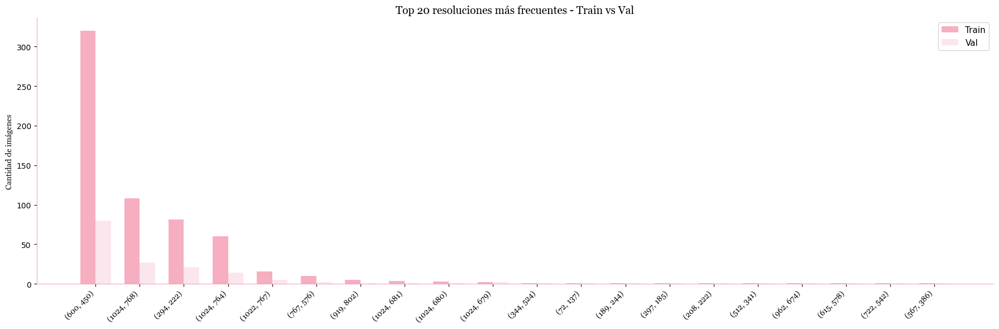

In [8]:
# Histograma mostrando cuántas imágenes hay de cada resolución, comparando train y val.

train_res = df_train.groupby("resolution").size().reset_index(name='count')
val_res = df_val.groupby("resolution").size().reset_index(name='count')

merged = train_res.merge(val_res, on='resolution', suffixes=('_train', '_val')).sort_values('count_train', ascending=False).head(20)

x = np.arange(len(merged))
width = 0.35

fig, ax = plt.subplots(figsize=(18,6))
ax.bar(x - width/2, merged['count_train'], width, label='Train', color='#f4a7b9', alpha=0.9)
ax.bar(x + width/2, merged['count_val'], width, label='Val', color='#fce4ec', alpha=0.9)

ax.set_xticks(x)
ax.set_xticklabels(merged['resolution'], rotation=45, ha='right', fontfamily='Georgia')
ax.set_ylabel('Cantidad de imágenes', fontfamily='Georgia')
ax.set_title('Top 20 resoluciones más frecuentes - Train vs Val', fontfamily='Georgia', fontsize=14)
ax.legend(fontsize=11)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')
plt.tight_layout()
plt.show()

# 3. Ejemplos visuales de cada clase 

## 3.a. 5 imagenes por clase de entrenamiento

A continuación se muestran 5 imágenes de cada clase del conjunto de **entrenamiento**. 

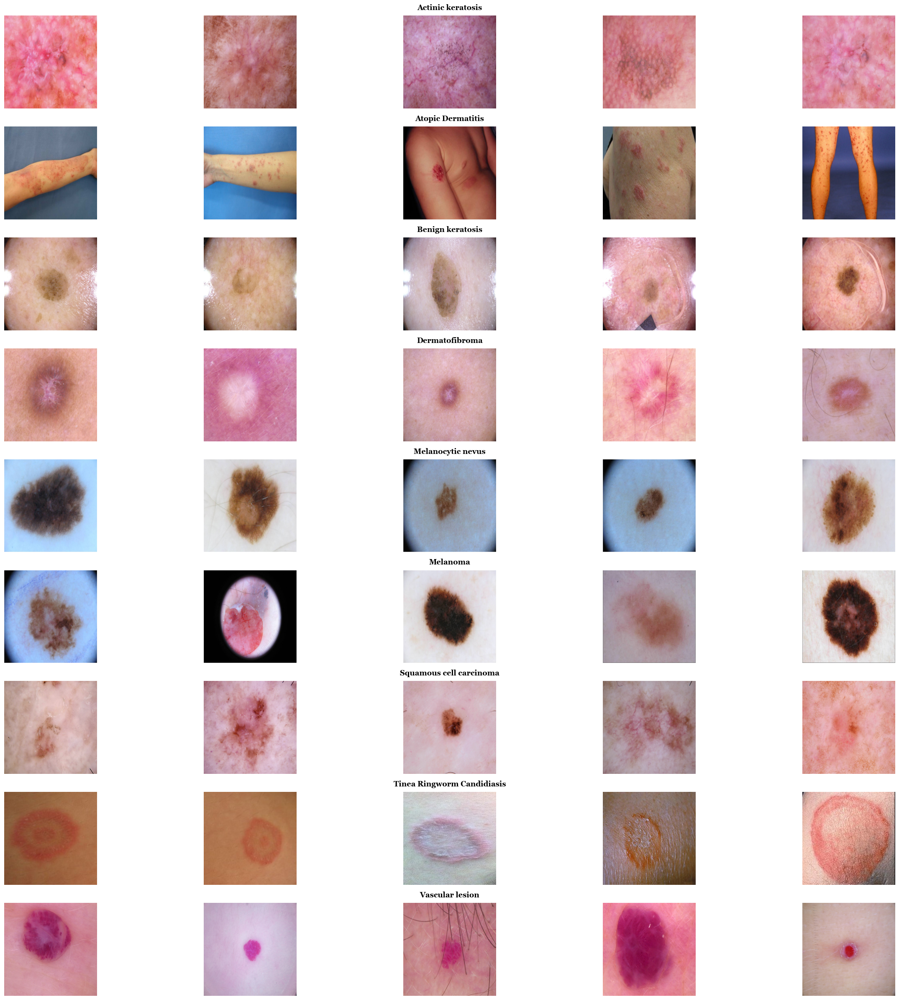

In [9]:
# Muestra 5 imágenes por cada una de las 9 clases del conjunto de TRAIN.
imgs = 5
classes = 9
fig, axes = plt.subplots(nrows=classes, ncols=imgs, figsize=(24,24))
fig.tight_layout(h_pad=1)
aux_df = df_train.groupby("class").head(imgs)

for idx in range(classes*imgs):
    ax = plt.subplot(classes, imgs, idx+1)
    img = aux_df.data.iloc[idx].resize((224, 224))
    ax.imshow(img)
    ax.axis('off')

# Título 
for row, cls in enumerate(aux_df["class"].unique()):
    axes[row, 2].set_title(cls, fontsize=13, fontweight='bold', 
                           color='black', fontfamily='Georgia', pad=10)

plt.show()

## 3.b. 5 imagenes por clase de validación

A continuación se muestran 5 imágenes de cada clase del conjunto de **Validacion**. 

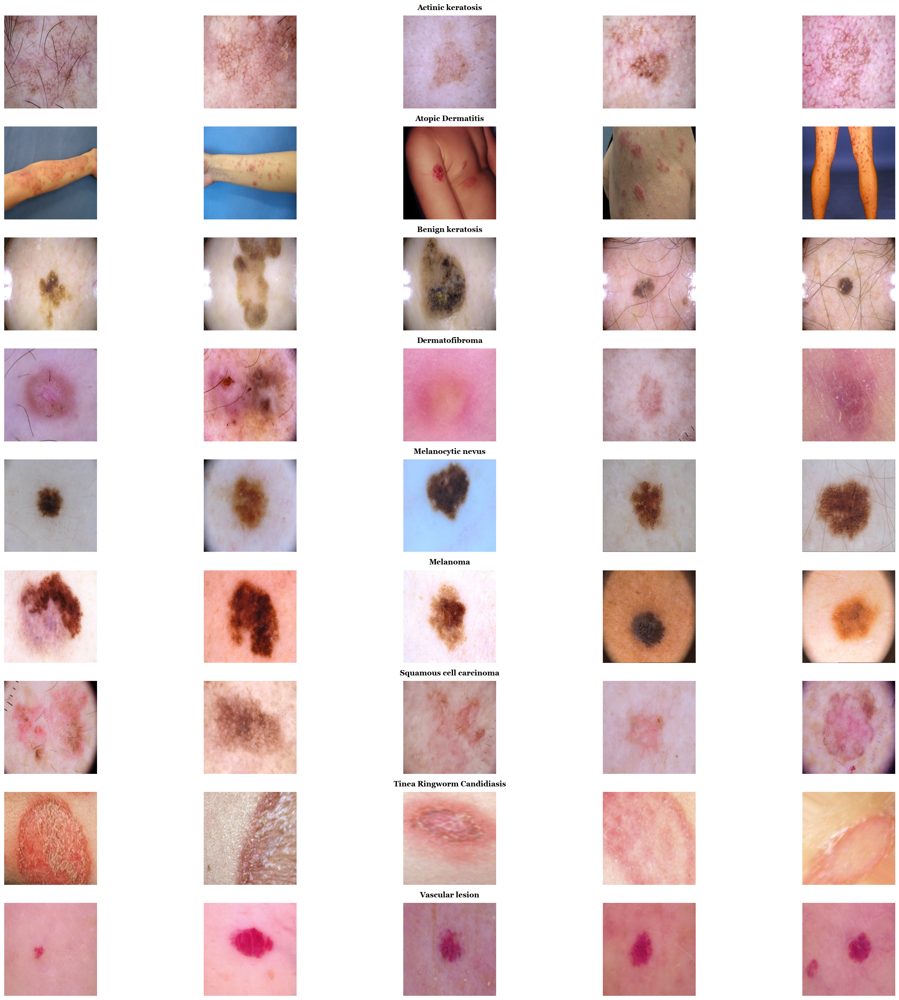

In [10]:
# Muestra 5 imágenes por cada una de las 9 clases del conjunto de VAL.
imgs = 5
classes = 9
fig, axes = plt.subplots(nrows=classes, ncols=imgs, figsize=(24,24))
fig.tight_layout(h_pad=1)
aux_df = df_val.groupby("class").head(imgs)

for idx in range(classes*imgs):
    ax = plt.subplot(classes, imgs, idx+1)
    img = aux_df.data.iloc[idx].resize((224, 224))
    ax.imshow(img)
    ax.axis('off')
    ax.set_title("")

# Título 
for row, cls in enumerate(aux_df["class"].unique()):
    axes[row, 2].set_title(cls, fontsize=13, fontweight='bold', 
                           color='black', fontfamily='Georgia', pad=10)

plt.show()

# 4. Varianza intra-clase

## 4.a.Varianza TRAIN vs VAL 

La varianza intra-clase mide qué tan distintas son las imágenes dentro de una misma clase. Una varianza alta indica que el modelo tendrá más dificultad aprendiendo patrones consistentes, y que técnicas como data augmentation y regularización serán más necesarias. Se compara train y val para verificar consistencia.

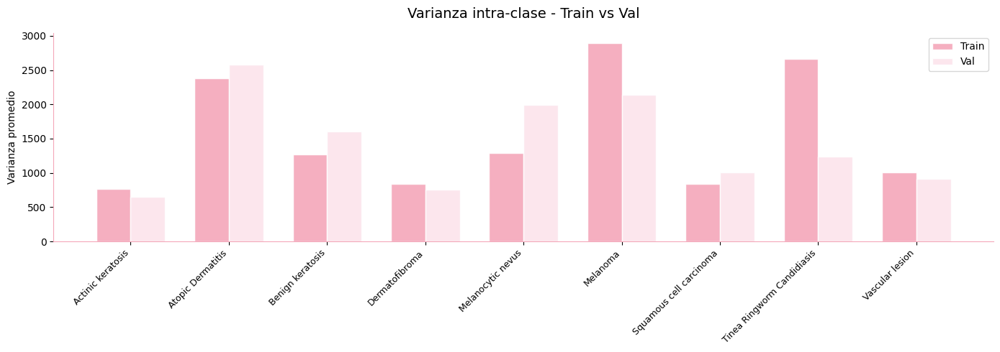

In [11]:
# Varianza intra-clase (Train vs Val)
target_size = (64, 64)
classes = sorted(df_train["class"].unique())

varianzas_train = {}
varianzas_val = {}

for cls in classes:
    imgs_train = df_train[df_train["class"] == cls]["data"]
    imgs_array_train = np.array([
        np.array(img.resize(target_size)).flatten()
        for img in imgs_train
    ])
    varianzas_train[cls] = imgs_array_train.var(axis=0).mean()

    imgs_val = df_val[df_val["class"] == cls]["data"]
    imgs_array_val = np.array([
        np.array(img.resize(target_size)).flatten()
        for img in imgs_val
    ])
    varianzas_val[cls] = imgs_array_val.var(axis=0).mean()

# Graficar barras agrupadas
x = np.arange(len(classes))
width = 0.35

fig, ax = plt.subplots(figsize=(14, 5))
ax.bar(x - width/2, varianzas_train.values(), width, 
       label='Train', color='#f4a7b9', alpha=0.9, edgecolor='white')
ax.bar(x + width/2, varianzas_val.values(), width, 
       label='Val', color='#fce4ec', alpha=0.9, edgecolor='white')

ax.set_xticks(x)
ax.set_xticklabels(classes, rotation=45, ha='right', fontsize=9)
ax.set_ylabel('Varianza promedio')
ax.set_title('Varianza intra-clase - Train vs Val', fontsize=14, pad=15)
ax.legend(fontsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#f4a7b9')
ax.spines['bottom'].set_color('#f4a7b9')
plt.tight_layout()
plt.show()

Conclusiones:  la varianza intra-clase, **Melanoma y Atopic Dermatitis** presentan la mayor dispersión visual, es mas dificil que el modelo aprenda patrones consistentes. Por su parte, **Actinic keratosis y Dermatofibroma** muestran baja varianza. 

Un caso particular es **Tinea Ringworm Candidiasis**, como ya mencionamos, es la clase con menor representación general, y con  menos imágenes en Train (55) que el resto: la diferencia observada en su varianza entre TRAIN y VAL podría explicarse por esto más que por una real heterogeneidad visual de la clase.

## 4.b. ¿ Se debe a esta cantidad menor de imagenes ( totales y de TRAIN) ?



In [12]:
target_size = (64, 64)
classes = sorted(df_train["class"].unique())

arrays_train = {}
for cls in classes:
    imgs = df_train[df_train["class"] == cls]["data"]
    arrays_train[cls] = np.array([
        np.array(img.resize(target_size)).flatten()
        for img in imgs
    ])

arrays_val = {}
for cls in classes:
    imgs = df_val[df_val["class"] == cls]["data"]
    arrays_val[cls] = np.array([
        np.array(img.resize(target_size)).flatten()
        for img in imgs
    ])

TINEA_CLASS = "Tinea Ringworm Candidiasis"
n_tinea = len(arrays_train[TINEA_CLASS])
tinea_var_real = arrays_train[TINEA_CLASS].var(axis=0).mean()
tinea_var_val  = arrays_val[TINEA_CLASS].var(axis=0).mean()



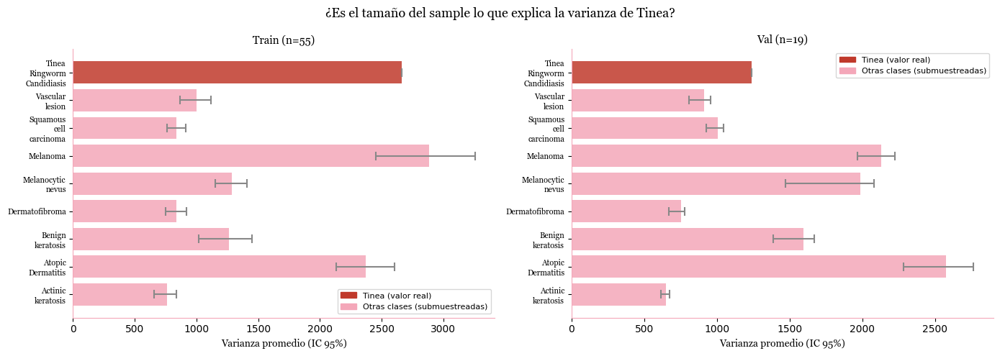

In [13]:
N_ITER = 500

def bootstrap_variance(arr, n_samples, n_iter=N_ITER, seed=42):
    rng = np.random.default_rng(seed)
    return np.array([
        arr[rng.choice(len(arr), size=n_samples, replace=False)].var(axis=0).mean()
        for _ in range(n_iter)
    ])

n_tinea_train = len(arrays_train[TINEA_CLASS])
n_tinea_val   = min(len(arrays_val[cls]) for cls in classes)

boot_train = {
    cls: bootstrap_variance(arrays_train[cls], n_samples=n_tinea_train)
    for cls in classes
    if cls != TINEA_CLASS and len(arrays_train[cls]) >= n_tinea_train
}
boot_val = {
    cls: bootstrap_variance(arrays_val[cls], n_samples=n_tinea_val)
    for cls in classes
    if cls != TINEA_CLASS and len(arrays_val[cls]) >= n_tinea_val
}

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('¿Es el tamaño del sample lo que explica la varianza de Tinea?',
             fontfamily='Georgia', fontsize=13)

for ax, boot, tinea_var, tinea_n, label in [
    (axes[0], boot_train, tinea_var_real, n_tinea_train, f'Train (n={n_tinea_train})'),
    (axes[1], boot_val,   tinea_var_val,  n_tinea_val,   f'Val (n={n_tinea_val})')
]:
    cls_labels = [cls.replace(' ', '\n') for cls in boot] + [TINEA_CLASS.replace(' ', '\n')]
    means = [np.mean(v) for v in boot.values()] + [tinea_var]
    lo    = [np.percentile(v, 2.5) for v in boot.values()] + [tinea_var]
    hi    = [np.percentile(v, 97.5) for v in boot.values()] + [tinea_var]
    y_pos = np.arange(len(cls_labels))
    bar_colors = ['#f4a7b9'] * (len(cls_labels) - 1) + ['#c0392b']

    ax.barh(y_pos, means,
            xerr=[np.array(means)-np.array(lo), np.array(hi)-np.array(means)],
            color=bar_colors, alpha=0.85, capsize=4,
            error_kw={'ecolor': '#888', 'capthick': 1.5})
    ax.set_yticks(y_pos)
    ax.set_yticklabels(cls_labels, fontsize=8, fontfamily='Georgia')
    ax.set_xlabel('Varianza promedio (IC 95%)', fontfamily='Georgia')
    ax.set_title(label, fontfamily='Georgia', fontsize=11)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color('#f4a7b9')
    ax.spines['bottom'].set_color('#f4a7b9')
    ax.legend(handles=[
        mpatches.Patch(color='#c0392b', label='Tinea (valor real)'),
        mpatches.Patch(color='#f4a7b9', label='Otras clases (submuestreadas)')
    ], fontsize=8)

plt.tight_layout()
plt.show()

### Análisis de Bootstrap: ¿La varianza de Tinea se debe al tamaño del sample?

Para verificar si la alta varianza observada en Tinea Ringworm Candidiasis se debe a su menor cantidad de imágenes o a una heterogeneidad visual real, se aplicó bootstrapping: se submuestreó cada clase 500 veces al mismo tamaño que Tinea (n=55 en train, n=19 en val) y se calculó la varianza en cada iteración, obteniendo así una distribución de varianzas esperadas para ese tamaño.

**Train (n=55):** Si miramos el gráfico, Tinea (la barra roja) es de las más largas pero no la única, Melanoma se le acerca bastante. Ambas están bien separadas del resto de las clases. Esto sugiere que la alta varianza de Tinea en train no es debido al tamaño del sample: otras clases con el mismo n tienen varianzas menores.


**Val (n=19):** La varianza real de Tinea en val (1237) cae dentro del rango esperado de las otras clases submuestreadas a n=19. Con muestras tan pequeñas, la estimación de varianza es inherentemente inestable y puede variar ampliamente entre subsets. 

# 5. HEATMAPS: Similitud visual entre clases

## 5.a. Similitud visual entre clases: con TRAIN

El siguiente heatmap muestra qué tan parecidas son las imágenes de cada par de clases en términos de colores y píxeles. Valores cercanos a 1 indican clases muy similares visualmente, ¡ el modelo va a tener  más dificultad para diferenciarlas !


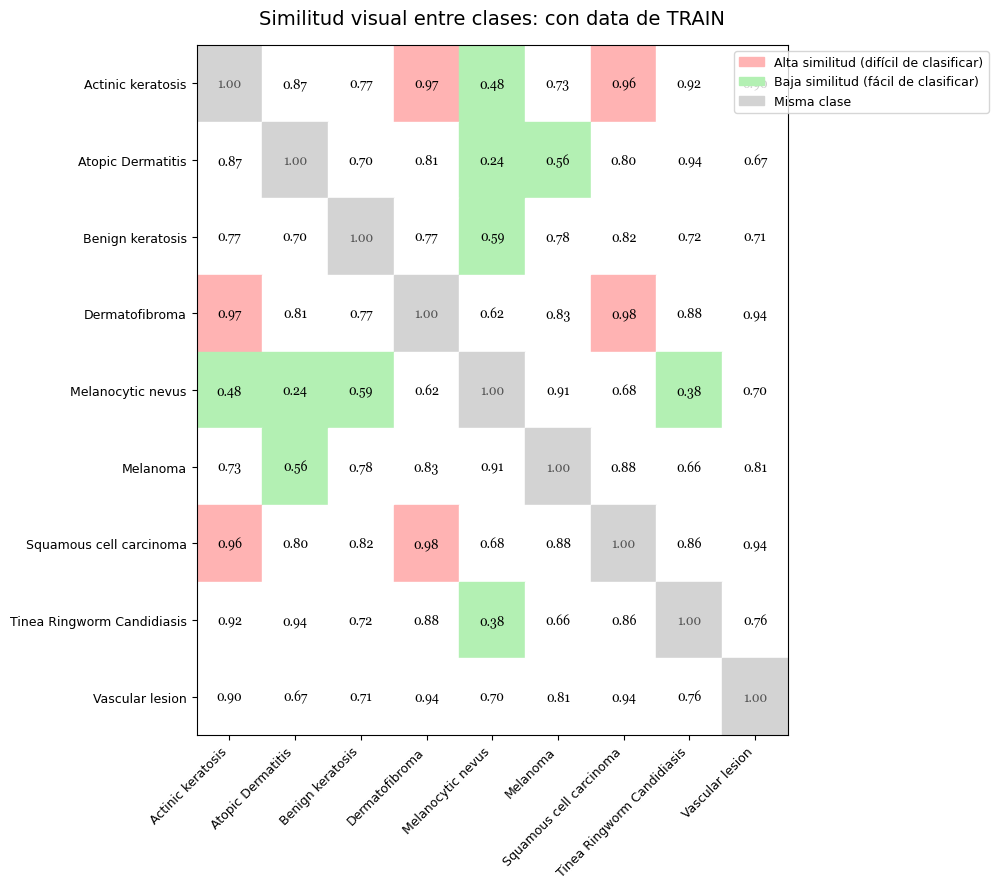

In [14]:
# Heatmap de similitud visual entre clases. TRAIN
target_size = (64, 64)
classes = sorted(df_train["class"].unique())

# Calcular vector promedio por clase
class_means = {}
for cls in classes:
    imgs = df_train[df_train["class"] == cls]["data"]
    imgs_array = np.array([
        np.array(img.resize(target_size)).flatten()
        for img in imgs
    ])
    class_means[cls] = imgs_array.mean(axis=0)

# Calcular matriz de similitud
n = len(classes)
similarity_matrix = np.zeros((n, n))
for i, cls1 in enumerate(classes):
    for j, cls2 in enumerate(classes):
        corr = np.corrcoef(class_means[cls1], class_means[cls2])[0, 1]
        similarity_matrix[i, j] = corr

# Colores por celda
fig, ax = plt.subplots(figsize=(11, 9))

for i in range(n):
    for j in range(n):
        val = similarity_matrix[i, j]
        if i == j:
            color = '#d3d3d3'  # gris diagonal
        elif val >= 0.95:
            color = '#ffb3b3'  # rojo pastel - difíciles
        elif val <= 0.60:
            color = '#b3f0b3'  # verde pastel - fáciles
        else:
            color = 'white'
        
        ax.add_patch(plt.Rectangle((j-0.5, i-0.5), 1, 1, color=color))
        
        txt_color = '#555555' if i == j else 'black'
        ax.text(j, i, f'{val:.2f}', ha='center', va='center', 
                fontsize=9, color=txt_color, fontfamily='Georgia')

ax.set_xticks(range(n))
ax.set_yticks(range(n))
ax.set_xticklabels(classes, rotation=45, ha='right', fontsize=9)
ax.set_yticklabels(classes, fontsize=9)
ax.set_title('Similitud visual entre clases: con data de TRAIN', fontsize=14, pad=15)
ax.set_xlim(-0.5, n-0.5)
ax.set_ylim(-0.5, n-0.5)
ax.invert_yaxis()


# Leyenda
from matplotlib.patches import Patch
legend = [
    Patch(color='#ffb3b3', label='Alta similitud (difícil de clasificar)'),
    Patch(color='#b3f0b3', label='Baja similitud (fácil de clasificar)'),
    Patch(color='#d3d3d3', label='Misma clase')
]
ax.legend(handles=legend, loc='upper right', bbox_to_anchor=(1.35, 1), fontsize=9)

plt.tight_layout()
plt.show()

Como podemos visualizar: los pares mas dificiles de diferenciar en TRAIN: 

- **Dermatofibroma y Squamous cell carcinoma** (0.98) 
- **Actinic keratosis y Dermatofibroma** (0.97) 
- **Actinic keratosis y Squamous cell carcinoma** (0.96) 

Por su parte: los pares mas distintos/ mas faciles de diferenciar en VAL: 

- **Melanocytic nevus y Atopic Dermatitis** (0.24)
- **Melanocytic nevus y Actinic keratosis** (0.48) 
- **Melanoma y Atopic Dermatitis** (0.56) 



## 5.b. Similitud visual entre clases: con VAL

El siguiente heatmap muestra qué tan parecidas son las imágenes de cada par de clases en términos de colores y píxeles. Valores cercanos a 1 indican clases muy similares visualmente, ¡ el modelo va a tener  más dificultad para diferenciarlas !

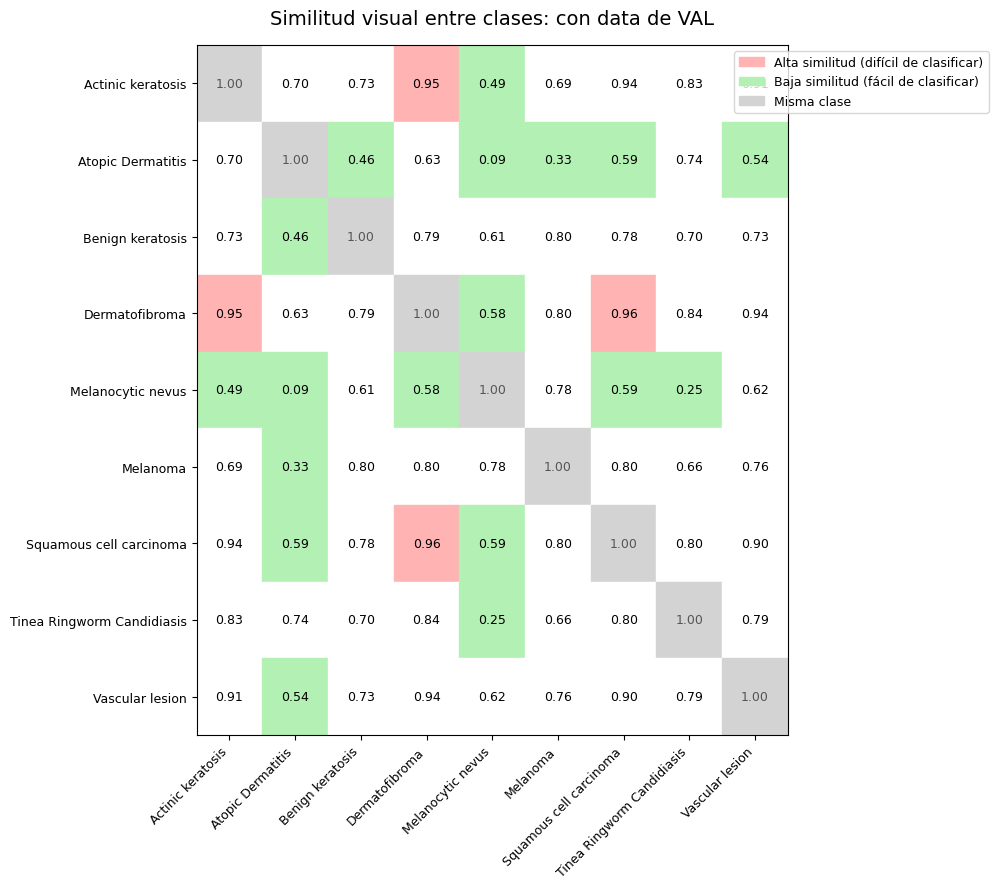

In [15]:
# Heatmap de similitud visual entre clases:  VAL

target_size = (64, 64)
classes = sorted(df_val["class"].unique())

# Calcular vector promedio por clase
class_means_val = {}
for cls in classes:
    imgs = df_val[df_val["class"] == cls]["data"]
    imgs_array = np.array([
        np.array(img.resize(target_size)).flatten()
        for img in imgs
    ])
    class_means_val[cls] = imgs_array.mean(axis=0)

# Calcular matriz de similitud
n = len(classes)
similarity_matrix_val = np.zeros((n, n))
for i, cls1 in enumerate(classes):
    for j, cls2 in enumerate(classes):
        corr = np.corrcoef(class_means_val[cls1], class_means_val[cls2])[0, 1]
        similarity_matrix_val[i, j] = corr

# Graficar
fig, ax = plt.subplots(figsize=(11, 9))

for i in range(n):
    for j in range(n):
        val = similarity_matrix_val[i, j]
        if i == j:
            color = '#d3d3d3'
        elif val >= 0.95:
            color = '#ffb3b3'
        elif val <= 0.60:
            color = '#b3f0b3'
        else:
            color = 'white'
        
        ax.add_patch(plt.Rectangle((j-0.5, i-0.5), 1, 1, color=color))
        txt_color = '#555555' if i == j else 'black'
        ax.text(j, i, f'{val:.2f}', ha='center', va='center', 
                fontsize=9, color=txt_color)

ax.set_xticks(range(n))
ax.set_yticks(range(n))
ax.set_xticklabels(classes, rotation=45, ha='right', fontsize=9)
ax.set_yticklabels(classes, fontsize=9)
ax.set_xlim(-0.5, n-0.5)
ax.set_ylim(-0.5, n-0.5)
ax.invert_yaxis()
ax.set_title('Similitud visual entre clases: con data de VAL', fontsize=14, pad=15)

from matplotlib.patches import Patch
legend = [
    Patch(color='#ffb3b3', label='Alta similitud (difícil de clasificar)'),
    Patch(color='#b3f0b3', label='Baja similitud (fácil de clasificar)'),
    Patch(color='#d3d3d3', label='Misma clase')
]
ax.legend(handles=legend, loc='upper right', bbox_to_anchor=(1.35, 1), fontsize=9)

plt.tight_layout()
plt.show()

Como podemos visualizar, los pares más difíciles de diferenciar en VAL:

- **Dermatofibroma y Squamous cell carcinoma** (0.96)
- **Actinic keratosis y Dermatofibroma** (0.95)
- **Vascular lesion y Dermatofibroma** (0.94)

Por su parte, los pares más distintos y más fáciles de diferenciar en VAL:

- **Melanocytic nevus y Atopic Dermatitis** (0.09)
- **Atopic Dermatitis y Benign keratosis** (0.46)
- **Melanoma y Atopic Dermatitis** (0.33)

## 5.c.  Conclusiones de comparacion de HEATMAPS: TRAIN Y VAL

Los patrones de similitud son parecidos entre ambos conjuntos de datos, mas uqe nada los mismos pares problemáticos aparecen en train y val.

En val las similitudes son en general más bajas. Esto puede ser porque val tiene menos imágenes por clase.

**Es decir:** El modelo va a tener más dificultad diferenciando Dermatofibroma - Squamous cell carcinoma y Dermatofibroma - Actinic keratosis 